In [20]:
!nvidia-smi

Thu Apr 23 05:54:32 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0    24W /  75W |   7513MiB /  7611MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [19]:
#' ' means CPU whereas '/device:G:0' means GPU
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [2]:
!pip install -q cython pyyaml==5.1 # line 3
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI' #line 4

In [0]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -q -e detectron2_repo

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.


In [0]:
# install dependencies: (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html

In [0]:
!pip install -q -U watermark

In [3]:
%reload_ext watermark
%watermark -v -p numpy,pandas,pycocotools,torch,torchvision,detectron2

CPython 3.6.9
IPython 5.5.0

numpy 1.18.2
pandas 1.0.3
pycocotools 2.0
torch 1.4.0+cu100
torchvision 0.5.0+cu100
detectron2 0.1.1


In [4]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import glob

import os
import ntpath
import numpy as np
import cv2
import random
import itertools
import pandas as pd
from tqdm import tqdm
import urllib
import json
import PIL.Image as Image

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
# !gdown --id ...
# Mount Google Drive
from google.colab import drive # import drive from google colab

ROOT = "/content/drive/"     # default location for the drive
print(ROOT)                 # print content of ROOT (Optional)

drive.mount(ROOT)           # we mount the google drive at /content/drive

/content/drive/
Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [6]:
cd '/content/drive/My Drive/Root2/Spring 2020/CSCI7200MasterProjectNT/MS_PROJECT/Data/'

/content/drive/My Drive/Root2/Spring 2020/CSCI7200MasterProjectNT/MS_PROJECT/Data


In [7]:
DataSetDF = pd.read_csv('FL_Keys_Coral-export.csv')
DataSetDF.head(10)

,image,xmin,ymin,xmax,ymax,label
0,3D_L0215_161.jpg,1845.536472,1136.637177,2176.761416,1522.154964,Past
1,3D_L0215_161.jpg,1454.378619,86.026186,2005.416481,670.326581,Past
2,3D_L0215_161.jpg,538.993318,134.215909,794.939866,447.449111,Past
3,3D_L0215_161.jpg,867.207127,519.733696,1297.799555,781.765316,Gorgonia
4,3D_L0215_161.jpg,27.100223,284.808794,542.004454,700.445158,Gorgonia
5,3D_L0215_161.jpg,746.081361,178.226953,1369.386483,434.234858,Gorgonia
6,3D_L0215_161.jpg,2360.730512,1179.330534,2704.000000,1417.267292,Gorgonia
7,3D_L0215_161.jpg,1912.071269,592.018281,2434.522867,950.193705,Gorgonia
8,3D_L0215_161.jpg,1689.247216,0.000000,2183.073497,200.476779,Gorgonia
9,3D_L0215_161.jpg,0.000000,4.706028,421.559020,194.453063,Gorgonia


In [8]:
print(DataSetDF.image.unique().shape[0], DataSetDF.shape[0])

133 3999


In [0]:
def annotate_image(annotations, resize=True):
  file_name = annotations.image.to_numpy()[0]
  img = cv2.cvtColor(cv2.imread(f'/content/drive/My Drive/Root2/Spring 2020/CSCI7200MasterProjectNT/MS_PROJECT/Data/vott-csv-export/JPGImages/{file_name}'), cv2.COLOR_BGR2RGB)

  for i, a in annotations.iterrows():    
    cv2.rectangle(img, (int(a.xmin), int(a.ymin)), (int(a.xmax), int(a.ymax)), (0, 255, 0), 2)

  if not resize:
    return img

  return cv2.resize(img, (384, 384), interpolation = cv2.INTER_AREA)

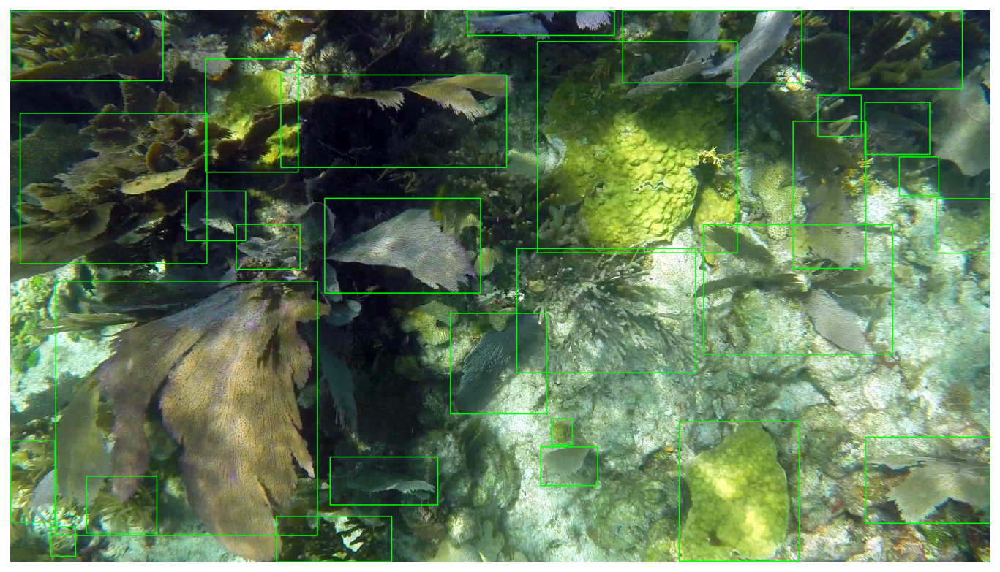

In [9]:
img_df = DataSetDF[DataSetDF.image == DataSetDF.image.unique()[0]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

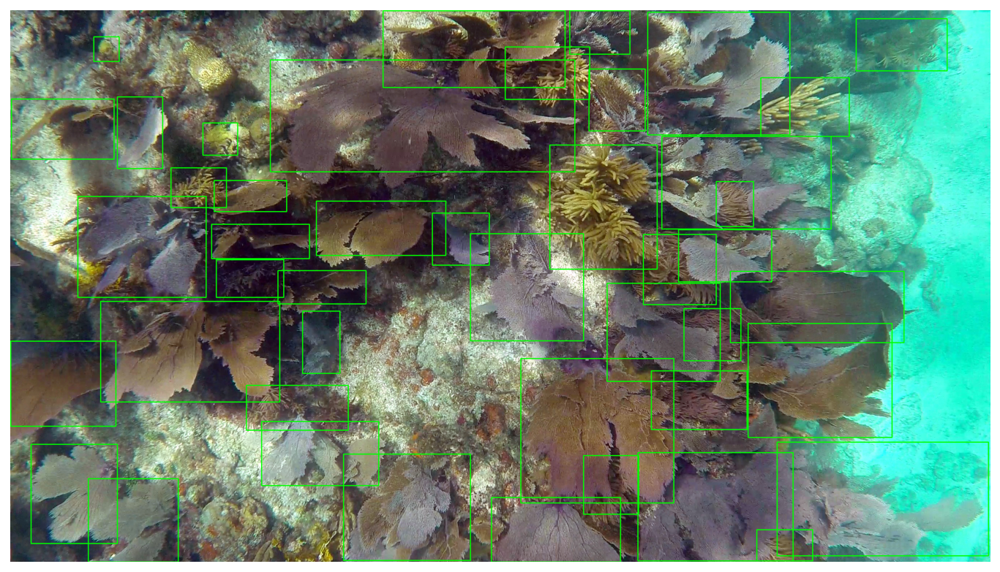

In [10]:
img_df = DataSetDF[DataSetDF.image == DataSetDF.image.unique()[1]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

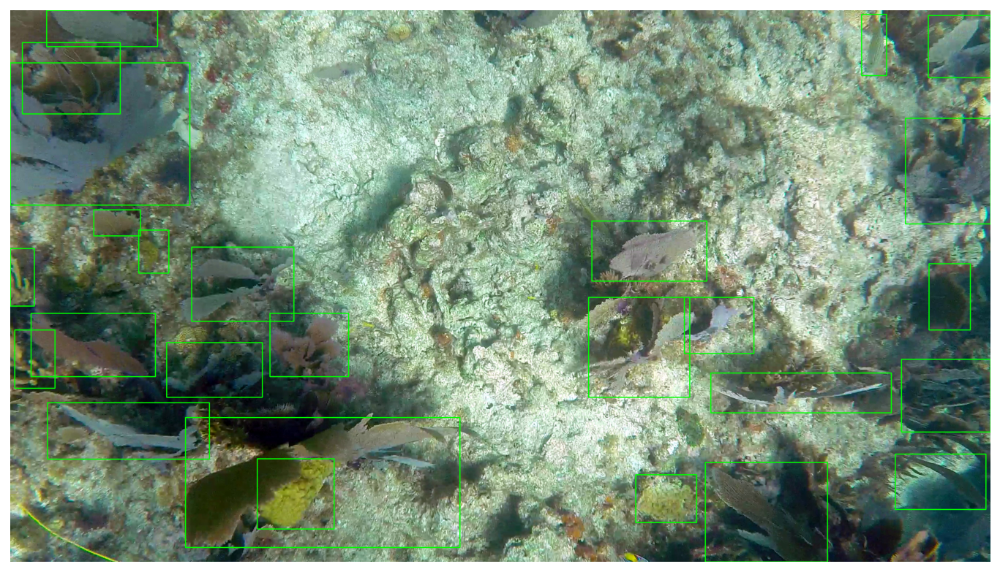

In [11]:
img_df = DataSetDF[DataSetDF.image == DataSetDF.image.unique()[2]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

In [0]:
# more ...

# Object Detection with Detectron 2

In [9]:
# Additional:
# !pwd
df = pd.read_csv('FL_Keys_Coral-export.csv')
IMAGES_PATH = '/content/drive/My Drive/Root2/Spring 2020/CSCI7200MasterProjectNT/MS_PROJECT/Data/vott-csv-export/JPGImages'
unique_files = df.image.unique()

train_files = set(np.random.choice(unique_files, int(len(unique_files)*0.8), replace=False))
train_df = df[df.image.isin(train_files)]
test_df = df[~df.image.isin(train_files)]

train_df.head()

,image,xmin,ymin,xmax,ymax,label
0,3D_L0215_161.jpg,1845.536472,1136.637177,2176.761416,1522.154964,Past
1,3D_L0215_161.jpg,1454.378619,86.026186,2005.416481,670.326581,Past
2,3D_L0215_161.jpg,538.993318,134.215909,794.939866,447.449111,Past
3,3D_L0215_161.jpg,867.207127,519.733696,1297.799555,781.765316,Gorgonia
4,3D_L0215_161.jpg,27.100223,284.808794,542.004454,700.445158,Gorgonia


In [10]:
classes = df.label.unique().tolist()
print(classes)

['Past', 'Gorgonia', 'SeaRods', 'Antillo', 'Fish', 'Ssid', 'Orb', 'Other_Coral', 'Apalm', 'Galaxaura']


In [0]:
def create_dataset_dicts(df, classes):
  dataset_dicts = []
  for image_id, img_name in enumerate(df.image.unique()):

    record = {}

    image_df = df[df.image == img_name]

    file_path = f'{IMAGES_PATH}/{img_name}'
    record["file_name"] = file_path
    record["image_id"] = image_id
    # record["height"] = int(image_df.iloc[0].height)
    # record["width"] = int(image_df.iloc[0].width)

    record["height"] = 1524
    record["width"] = 2704

    objs = []
    for _, row in image_df.iterrows():

      xmin = int(row.xmin)
      ymin = int(row.ymin)
      xmax = int(row.xmax)
      ymax = int(row.ymax)

      poly = [
          (xmin, ymin), (xmax, ymin), 
          (xmax, ymax), (xmin, ymax)
      ]
      poly = list(itertools.chain.from_iterable(poly))

      obj = {
        "bbox": [xmin, ymin, xmax, ymax],
        "bbox_mode": BoxMode.XYXY_ABS,
        "segmentation": [poly],
        "category_id": classes.index(row.label),
        "iscrowd": 0
      }
      objs.append(obj)

    record["annotations"] = objs
    dataset_dicts.append(record)
  return dataset_dicts

In [0]:
name = 'CoralReef_'
for d in ["train", "val"]:
  DatasetCatalog.register(name + d, lambda d=d: create_dataset_dicts(train_df if d == "train" else test_df, classes))
  MetadataCatalog.get(name + d).set(thing_classes=classes)

statement_metadata = MetadataCatalog.get(name+"train")

In [0]:
class CocoTrainer(DefaultTrainer):
  
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

# Configuration Starts From Here:

In [0]:
cfg = get_cfg()

Faster_ROW1 = "COCO-Detection/faster_rcnn_R_50_C4_1x.yaml"
Faster_ROW2 = "x"
Faster_Row3 = "z"

RetinaNet_ROW1="COCO-Detection/retinanet_R_50_FPN_1x.yaml"

# Segmentation:
Tried = "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"

YAML_NAME = Faster_ROW1

cfg.merge_from_file(
  model_zoo.get_config_file(YAML_NAME)
)

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(YAML_NAME)

In [0]:
cfg.DATASETS.TRAIN = (name+"train",)
cfg.DATASETS.TEST = (name+"val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = True

In [0]:
cfg.SOLVER.IMS_PER_BATCH = 16
cfg.SOLVER.BASE_LR = 0.001
# cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.MAX_ITER = 300
# cfg.SOLVER.STEPS = (500, 1000)
cfg.SOLVER.GAMMA = 0.05

In [0]:
# The model itself
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

cfg.TEST.EVAL_PERIOD = 200

In [18]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/23 05:26:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_721ade.pkl: 136MB [00:02, 54.3MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 2048) in the checkpoint but (11, 2048) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (11,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 2048) in the checkpoint but (40, 2048) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (40,) in the model! Skipped.


[04/23 05:27:02 d2.engine.train_loop]: Starting training from iteration 0
ERROR [04/23 05:27:07 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/content/detectron2_repo/detectron2/engine/train_loop.py", line 132, in train
    self.run_step()
  File "/content/detectron2_repo/detectron2/engine/train_loop.py", line 215, in run_step
    loss_dict = self.model(data)
  File "/usr/local/lib/python3.6/dist-packages/torch/nn/modules/module.py", line 532, in __call__
    result = self.forward(*input, **kwargs)
  File "/content/detectron2_repo/detectron2/modeling/meta_arch/rcnn.py", line 121, in forward
    features = self.backbone(images.tensor)
  File "/usr/local/lib/python3.6/dist-packages/torch/nn/modules/module.py", line 532, in __call__
    result = self.forward(*input, **kwargs)
  File "/content/detectron2_repo/detectron2/modeling/backbone/resnet.py", line 458, in forward
    x = stage(x)
  File "/usr/local/lib/python3.6/dist-packages/torch/nn/m

RuntimeError: ignored

In [21]:
cd output/

/content/drive/My Drive/Root2/Spring 2020/CSCI7200MasterProjectNT/MS_PROJECT/Data/output


# Evaluation

In [22]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [0]:
pre_im = cv2.imread(Enhanced_Splitted+'test.png')

cv2_imshow(pre_im)

In [0]:
#So,far -> Just run it.
#TODO: Create a list for YAML_NAME and make it as a pipeline:

RetinaNet_ROW1 = "COCO-Detection/retinanet_R_50_FPN_1x.yaml"
RetinaNet_ROW2 = "x"
RetinaNet_Row3 = "z"

YAML_NAME = RetinaNet_ROW1

# There are hundred types of DefaultPredictors:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file(YAML_NAME))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(YAML_NAME)
predictor = DefaultPredictor(cfg)
outputs = predictor(pre_im)

In [0]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
outputs["instances"].pred_classes
outputs["instances"].pred_boxes

In [0]:
print(cfg.DATASETS.TRAIN[0])

In [0]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(pre_im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

# The challenge starts from here:

In [0]:
Enhanced_train = "./Data/enhanced_splitted_conf_annotated/SPLITTED_OBJECTs/train"
# Enhanced_test = "./Data/enhanced_splitted_conf_annotated/SPLITTED_OBJECTs/test/"
Enhanced_valid = "./Data/enhanced_splitted_conf_annotated/SPLITTED_OBJECTs/val"

TRAINjsonFileADR = Enhanced_train + '/enhanced_train.json'
# TESTjsonFileADR = Enhanced_test + '/Enhanced_test.json'
VALIDjsonFileADR= Enhanced_valid + '/enhanced_valid.json'

# jsonFileADR = './Data/vott-csv-export/JPGImages/output.json'
# imgDirADR = './Data/vott-csv-export/JPGImages/'

# Train on a custom dataset

In [0]:
from detectron2.data.datasets import register_coco_instances
Tname="Coral_train1"
Vname="Coral_validation1"

# from detectron2.data import DatasetCatalog
# from mydataset import load_mydataset_json
# def register_mydataset_instances(name, json_file):
#   DatasetCatalog.register(name, lambda:load_mydataset_json(json_file, name))

# register_mydataset_instances(Tname,TRAINjsonFileADR)
# register_mydataset_instances(Vname,VALIDjsonFileADR)

register_coco_instances(Tname, {}, TRAINjsonFileADR, Enhanced_train)
register_coco_instances(Vname, {}, VALIDjsonFileADR, Enhanced_valid)

# register_coco_instances("coral_test", {}, TESTjsonFileADR, Enhanced_test)

In [0]:
pwd

In [0]:
import os
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(YAML_NAME))
cfg.DATASETS.TRAIN = (Tname,) # "coral_train"
cfg.DATASETS.TEST = (Vname,) # empty!

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(YAML_NAME)  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

In [0]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

# Run a pre-trained detectron2 model

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = (Vname, )
predictor = DefaultPredictor(cfg)

In [0]:
outputs = predictor(pre_im)

In [0]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
outputs["instances"].pred_classes
outputs["instances"].pred_boxes

In [0]:
print(cfg.DATASETS.TEST[0])

In [0]:
# from detectron2.utils.visualizer import ColorMode
v = Visualizer(pre_im[:, :, ::-1],metadata=MetadataCatalog.get(cfg.DATASETS.TEST[0]),scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator(Vname, cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, Vname)
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

In [0]:
import json
from detectron2.structures import Boxes, BoxMode, PolygonMasks
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets.coco import convert_to_coco_json

""" Path and image names.
JPGImagesPATH = './Data/vott-csv-export/JPGImages/'
jpg1_str = 'A_3D_L0646_144.jpg'
"""

CSV_PATH = "../Data/Annotations/FL_Keys_Coral-export.csv"
JPG_PATH = '../Data/vott-csv-export/JPGImages/'

# List of images for later on tests.
imagelist1 = ['A_3D_L0646_144.jpg', '3D_L0622_176.jpg', '3R010215_829.jpg',
              '3D_L0622_139.jpg', 'B_3D_L0647_42.jpg']  # To do later on 5 different images.


def makeDF(csv_path):
    """ Read a comma-separated values (.csv) file into DataFrame.
    Arg: csv PATH:
    Return: new DF.
    """
    import pandas as pd
    DF = pd.read_csv(csv_path)

    # DF['height'] = DF.apply(lambda DF: abs(DF['ymax'] - DF['ymin']), axis=1)
    # DF['width'] = DF.apply(lambda DF: abs(DF['xmax'] - DF['xmin']), axis=1)
    # DF['objArea'] = DF.apply(lambda DF: (DF['width'] * DF['height']), axis=1)
    HEIGHT = 2704
    WIDTH = 1524
    imageArea = HEIGHT * WIDTH
    # DF['objPortion'] = DF.apply(lambda DF: (DF['objArea'] / imageArea), axis=1)

    # DF.to_csv('/NewDF.csv')

    # Looking at the first 5 rows to get the insigt on the data.
    # print(DF.head(5))
    # print(DF.label.unique())
    # print("\nMADE_DF(): Finished successfully!\n")
    return DF

def list_of_images(JPGPATH):
    """
    Arg: JPGPATH

    Return: listOf_images for creating the xml files.

    Used also in code5,.py
    """
    import os
    listOF_imgs = []
    # r=root, d=directories, f = files
    for r, d, f in os.walk(JPGPATH):
        for file in f:
            if '.jpg' in file:
                listOF_imgs.append(os.path.join(file))

    return listOF_imgs

def _get_coral_dicts():
    """
    ['Past', 'Gorgonia', 'SeaRods', 'Antillo', 'Fish', 'Ssid', 'Orb', 'Other_Coral', 'Apalm', 'Galaxaura']
    366,3D_L0441_41.jpg,1771.9044368600685,922.25870157385,1984.1638225255965,1184.2538589588378,Ssid,261.9951573849878,212.25938566552804,55610.93115388085,0.013494864018378733
    367,3D_L0441_41.jpg,1336.3112627986347,93.8373940677966,1687.0006825938567,274.65095338983053,Antillo,180.81355932203394,350.68941979522197,63409.40220975303,0.01538728524324638
    368,3D_L0441_41.jpg,1395.3747440273034,1147.3531325665856,1519.038907849829,1304.181219733656,Antillo,156.8280871670704,123.66416382252555,19394.01426340191,0.004706261517738354
    369,3D_L0441_41.jpg,1194.1897610921499,483.39951573849885,1380.6088737201364,758.0504691283293,Antillo,274.6509533898304,186.41911262798658,51200.18701336269,0.01242452782437671
    """

    imgs_anns = makeDF(CSV_PATH)
    # print(type(imgs_anns))

    THING_CLASSES = list(imgs_anns.label.unique())
    # print(THING_CLASSES)

    datadict = []
    for IMG_id, fn in enumerate(list_of_images(JPG_PATH)):
        record = {}

        HEIGHT = 1524
        WIDTH = 2704
        # print(width, height)

        record['file_name'] = fn  # 4 objects lowest 3.
        record['image_id'] = IMG_id + 1
        record['height'] = HEIGHT
        record['width'] = WIDTH

        objs = []
        # print(imgs_anns[imgs_anns['image'] == fn].iterrows())  # Test
        for object_id, _ in imgs_anns[imgs_anns['image'] == fn].iterrows():
            # print(object_id, _) # Test

            xmin = imgs_anns["xmin"][object_id]
            ymin = imgs_anns["ymin"][object_id]
            xmax = imgs_anns["xmax"][object_id]
            ymax = imgs_anns["ymax"][object_id]

            bbox = [xmin, ymin, xmax, ymax]
            BBOX_MODE = BoxMode.XYXY_ABS  # CONSTANT.

            category_id = THING_CLASSES.index(imgs_anns["label"][object_id])
            # print(imgs_anns['label'][object_id], category_id)

            obj = {
                'bbox': bbox,
                'bbox_mode': BBOX_MODE,
                'category_id': category_id,
            }
            objs.append(obj)
            record['annotations'] = objs

        datadict.append(record)

    return datadict


A really good chapter of this book that I like to mention and it released in the middle of my reserach: https://leanpub.com/getting-things-done-with-pytorch